In [1]:
! which python

/Users/no_lineal/opt/anaconda3/envs/research36/bin/python


In [2]:
import pandas as pd
import numpy as np

import mat73

from tqdm import tqdm

import os

# viz
import plotly.express as px

In [3]:
"""

    where am i?

"""

PATH = os.getcwd() + '/'
data_path = PATH + 'data/'

print(f'PATH: {PATH}')
print(f'data path: {data_path}')

PATH: /Users/no_lineal/Documents/GitHub/eeg_processing/
data path: /Users/no_lineal/Documents/GitHub/eeg_processing/data/


In [4]:
"""

    load data

"""

# signal
folder_name = 'LFP_conditions/'

# dorsal
d_cong = mat73.loadmat( data_path + folder_name + 'dcong.mat' )['dcong']
d_incong = mat73.loadmat( data_path + folder_name + 'dincg.mat' )['dincg']

In [5]:
"""

    dorsal trials

"""

d_cong_trial = sorted( [ x for x in d_cong.keys() if 'STN' in x ] )
d_incong_trial = sorted( [ x for x in d_incong.keys() if 'STN' in x ] )

trials = sorted(list(set(d_cong_trial).intersection( set(d_incong_trial) )))

print( f'd_cong_trial: {d_cong_trial}' )
print( f'd_incong_trial: {d_incong_trial}' )
print( f'trials: {trials}' )

d_cong_trial: ['STN02', 'STN03', 'STN07a', 'STN08', 'STN10a', 'STN10b', 'STN11', 'STN13']
d_incong_trial: ['STN02', 'STN07a', 'STN08', 'STN10a', 'STN10b', 'STN11', 'STN13']
trials: ['STN02', 'STN07a', 'STN08', 'STN10a', 'STN10b', 'STN11', 'STN13']


In [6]:
"""

    signal sample

"""

# response
cue_type = 'sigcue'

# sampling frequency
f = 1000

# sample subject
ss = np.random.choice(trials)

print(f'smaple subject: {ss}')

cue_cong = d_cong[ ss ][ cue_type ][0][ 'dCong_trl' ]
cue_incg = d_incong[ ss ][ cue_type ][0][ 'dIncg_trl' ]

print(f'cong: {cue_cong.shape}')
print(f'incg: {cue_incg.shape}')

smaple subject: STN08
cong: (154, 2313)
incg: (162, 2098)


In [7]:
res = []

for a in [ cue_cong, cue_incg ]:
    
    aux = []
    
    for s in tqdm( range(a.shape[0]) ):
        
        tmp = a[s]
        tmp = tmp[ ~np.isnan(tmp) ]
        tmp = tmp[-300:]
        
        tmp = list(tmp)
        
        aux.append(tmp)
        
    res.append( aux )
    
res_cong = np.array( res[0] )
res_incg = np.array( res[1] )

print(f'cong: {res_cong.shape}')
print(f'incg: {res_incg.shape}')

100%|██████████| 162/162 [00:00<00:00, 36382.38it/s]

cong: (154, 300)
incg: (162, 300)


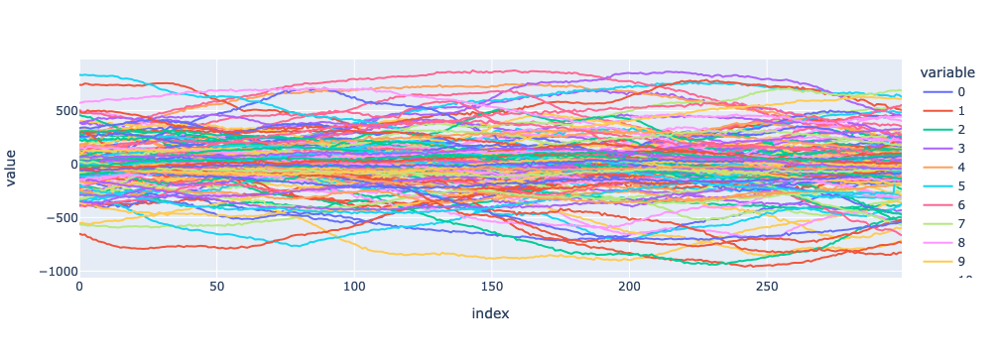

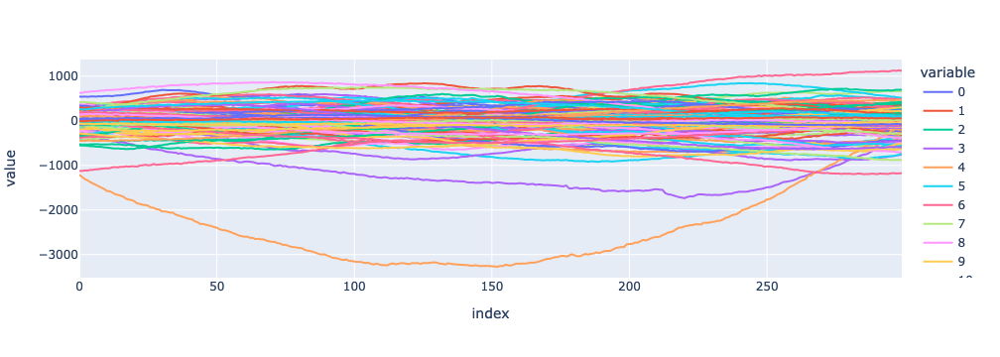

In [8]:
fig = px.line(data_frame=pd.DataFrame(res_cong.T))
fig.show()

fig = px.line(data_frame=pd.DataFrame(res_incg.T))
fig.show()